In [2]:
import plotly.graph_objects as go
import plotly.express as px 
import datetime as dt
import plotly.io as pio
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

In [3]:
#In Local machine
GIS = pd.read_csv('listings.csv')

In [4]:
GIS.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,35797,Villa in Mexico City · 1 bedroom · 1 bed · 1 bath,153786,Dici,NaN,Cuajimalpa de Morelos,19.382830,-99.271780,Entire home/apt,3390.0,1,0,NaN,NaN,1,363,0,NaN
1,607833,Rental unit in Mexico City · ★4.83 · 1 bedroom...,1849414,Omar,NaN,Gustavo A. Madero,19.483210,-99.112410,Private room,339.0,3,6,2016-06-01,0.05,1,86,0,NaN
2,1441434,Condo in Mexico City · ★4.90 · 1 bedroom · 1 b...,7740056,Mireya Cristina,NaN,Cuauhtémoc,19.429101,-99.160763,Entire home/apt,3350.0,9,221,2023-11-20,1.75,1,89,9,NaN
3,44616,Home in Mexico City · ★4.58 · 5 bedrooms · 8 b...,196253,Condesa Haus Bed & Breakfast CDMX,NaN,Cuauhtémoc,19.411620,-99.177940,Entire home/apt,18000.0,1,64,2023-03-26,0.43,13,365,2,NaN
4,1462549,Loft in Mexico City · ★4.90 · 1 bedroom · 2 be...,7838265,Ernesto,NaN,Miguel Hidalgo,19.428330,-99.176340,Entire home/apt,1002.0,3,99,2023-12-16,0.79,13,115,12,NaN


In [5]:
GIS.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],
      dtype='object')

In [6]:
GIS["number_of_reviews"].max()

1257

In [7]:
# Create a cumulative histogram using Plotly Express
fig = px.histogram(GIS, x='number_of_reviews', cumulative=True, histnorm='percent')

# Update layout
fig.update_layout(title='Cumulative Histogram of Number of Reviews',
                  xaxis_title='Number of Reviews',
                  yaxis_title='Percentage of Data',
                  shapes=[dict(type='line', x0=GIS['number_of_reviews'].min(), y0=90, x1=GIS['number_of_reviews'].max(), y1=90,
                               line=dict(color="Red", width=2, dash="dot"))],
                  annotations=[dict(x=GIS['number_of_reviews'].max(), y=90, xref="x", yref="y", text="90%")])

# Show the plot
fig.show()

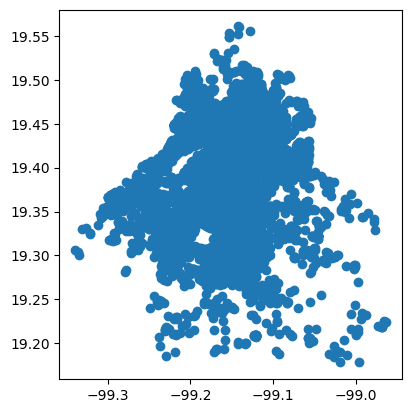

In [8]:
# Create a GeoDataFrame, using existing 'longitude' and 'latitude' columns in the CSV
GIS_t = gpd.GeoDataFrame(GIS, geometry=gpd.points_from_xy(GIS.longitude, GIS.latitude))

# Set the coordinate reference system (CRS) to WGS84 (lat/lon)
GIS_t.set_crs(epsg=4326, inplace=True)

# Plot the GeoDataFrame
GIS_t.plot()
plt.show()

In [9]:
# Get list of available Mapbox styles
mapbox_styles = ["carto-positron", "carto-darkmatter", "open-street-map"]

# Iterate through each map style
for style in mapbox_styles:
    # Create a scatter plot on a map using Plotly Express
    fig = px.scatter_mapbox(GIS, 
                        lat="latitude", 
                        lon="longitude", 
                        color="number_of_reviews", 
                        size="number_of_reviews",
                        color_continuous_scale='Jet',
                        range_color=[0, 200], 
                        zoom=10, 
                        size_max=30,
                        mapbox_style=style)  # Change map style here

    # Update layout to set custom window size and title
    fig.update_layout(width=1000, height=800, title=f"Map Style: {style}")

    # Show the plot
    fig.show()

In [11]:
# Get list of available Mapbox styles
mapbox_styles = ["carto-positron", "carto-darkmatter", "open-street-map"]

# Iterate through each map style
for style in mapbox_styles:
    # Create a density map on a map using Plotly Express
    fig = px.density_mapbox(GIS, 
                            lat="latitude", 
                            lon="longitude", 
                            radius=10,  # Adjust the radius as needed
                            color_continuous_scale='Jet',
                            zoom=10, 
                            mapbox_style=style)  # Change map style here

    # Update layout to set custom window size and title
    fig.update_layout(width=1000, height=800, title=f"Map Style: {style}")

    # Show the plot
    fig.show()

In [30]:
import requests
import json

overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query = """
[out:json];
area[name="Ciudad de México"]->.searchArea;
(
  relation["boundary"="administrative"]["admin_level"="6"](area.searchArea);
);
out body;
>;
out skel qt;
"""

response = requests.get(overpass_url, params={'data': overpass_query})
data = response.json()

# Print the names of municipalities
for element in data['elements']:
    if element['type'] == 'relation' and 'tags' in element and 'name' in element['tags']:
        print(element['tags']['name'])


Azcapotzalco
Benito Juárez
Coacalco de Berriozábal
Coyoacán
Cuajimalpa de Morelos
Cuauhtémoc
Ecatepec de Morelos
Gustavo A. Madero
Huixquilucan
Iztacalco
Iztapalapa
La Magdalena Contreras
Miguel Hidalgo
Milpa Alta
Naucalpan de Juárez
Ocoyoacac
Tepoztlán
Tlalnepantla de Baz
Tlalpan
Tláhuac
Tultitlán
Valle de Chalco Solidaridad
Venustiano Carranza
Xalatlaco
Xochimilco
Álvaro Obregón


In [31]:
import requests

overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query = """
[out:json];
area[name="Ciudad de México"]->.searchArea;
(
  relation["boundary"="administrative"]["admin_level"="6"](area.searchArea);
);
out body;
>;
out skel qt;
"""

response = requests.get(overpass_url, params={'data': overpass_query})
data = response.json()

# Save GeoJSON data to a file
with open("mexico_city_municipalities.geojson", "w") as f:
    json.dump(data, f)

print("GeoJSON data saved successfully!")


GeoJSON data saved successfully!


In [45]:
import json
import pandas as pd

# Load the GeoJSON file
with open('mexico_city_municipalities.geojson') as f:
    data = json.load(f)

# Initialize lists to store data
ids = []
types = []
refs = []
roles = []
tags = []

# Extract relevant data from GeoJSON elements
for element in data['elements']:
    ids.append(element['id'])
    types.append(element['type'])
    members = element.get('members', [])
    for member in members:
        refs.append(member['ref'])
        roles.append(member['role'])
    element_tags = element.get('tags', {})
    tags.append(element_tags)

# Ensure lists have the same length by filling in missing values
max_len = max(len(ids), len(types), len(refs), len(roles), len(tags))
ids += [None] * (max_len - len(ids))
types += [None] * (max_len - len(types))
refs += [None] * (max_len - len(refs))
roles += [None] * (max_len - len(roles))
tags += [None] * (max_len - len(tags))

# Create DataFrame
df = pd.DataFrame({
    'id': ids,
    'type': types,
    'ref': refs,
    'role': roles,
    'tags': tags
})

# Print the DataFrame
print(df)


               id      type           ref          role  \
0         5605571  relation  2.294184e+09  admin_centre   
1         5605589  relation  9.626659e+08         outer   
2         5605670  relation  9.620994e+08         outer   
3         5605709  relation  9.626659e+08         outer   
4         5605714  relation  9.620994e+08         outer   
...           ...       ...           ...           ...   
13695  1211717905       way           NaN          None   
13696  1211717906       way           NaN          None   
13697  1212402567       way           NaN          None   
13698  1273454206       way           NaN          None   
13699   962417191       way           NaN          None   

                                                    tags  
0      {'INEGI:MUNID': '09002', 'admin_level': '6', '...  
1      {'INEGI:MUNID': '09014', 'admin_level': '6', '...  
2      {'INEGI:MUNID': '15020', 'admin_level': '6', '...  
3      {'INEGI:MUNID': '09003', 'admin_level': '6', '..

In [46]:
df

,id,type,ref,role,tags
0,5605571,relation,2.294184e+09,admin_centre,"{'INEGI:MUNID': '09002', 'admin_level': '6', '..."
1,5605589,relation,9.626659e+08,outer,"{'INEGI:MUNID': '09014', 'admin_level': '6', '..."
2,5605670,relation,9.620994e+08,outer,"{'INEGI:MUNID': '15020', 'admin_level': '6', '..."
3,5605709,relation,9.626659e+08,outer,"{'INEGI:MUNID': '09003', 'admin_level': '6', '..."
4,5605714,relation,9.620994e+08,outer,"{'INEGI:MUNID': '09004', 'admin_level': '6', '..."
...,...,...,...,...,...
13695,1211717905,way,NaN,None,{}
13696,1211717906,way,NaN,None,{}
13697,1212402567,way,NaN,None,{}
13698,1273454206,way,NaN,None,{}
